In [2]:
import scanpy as sc

from step import scModel, stModel
from step.utils.misc import read_visium_hd

sc.set_figure_params(dpi=150, figsize=(6, 4.5), dpi_save=300)

/projects/82505004-e7a0-445f-ab3c-80d03c91438f/.cache/pypoetry/virtualenvs/step-Ajq_Bw_i-py3.10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Visium HD Mouse Small Intestine (8 um and 16 um) cell type clustering & spatial domain identification

## 16 um bin size: Cell type clustering

In [3]:
adata = read_visium_hd("./data/visium-hd/mouse-intesitine/square_016um/")

In [4]:
stepc = scModel(
    adata=adata,
    n_top_genes=2000,
)

Trying seurat_v3 for hvgs
not log_transformed
Adding count data to layer 'counts'
================Dataset Info================
Batch key: None 
Class key: None 
Number of Batches: 1 
Number of Classes: None 
Gene Expr: (90987, 2000)


In [5]:
stepc.run(epochs=400, batch_size=1024,)

Performing global random split
Current Mode: multi_batches_with_ct: ['gene_expr', 'class_label', 'batch_label']
 66%|██████▌   | 263/400 [18:32<09:39,  4.23s/epoch, kl_loss=0.937, recon_loss=392.133, val_kl_loss=0.933/0.565, val_recon_loss=393.606/392.961]


EarlyStopping counter: 30 out of 30
EarlyStopping counter: 263 out of 10


In [7]:
adata = stepc.adata

sc.pp.neighbors(adata, use_rep='X_rep', n_neighbors=60)
sc.tl.umap(adata)

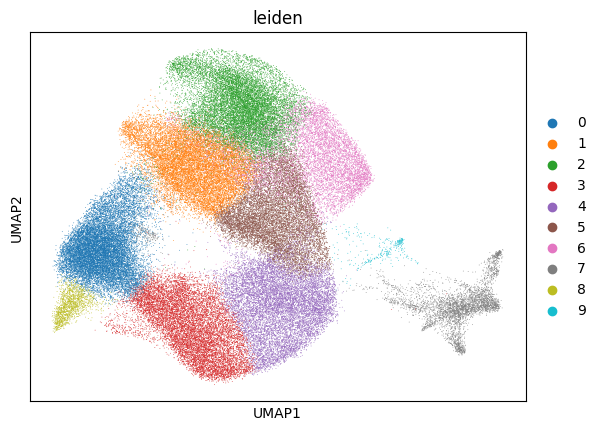

In [9]:
sc.tl.leiden(adata)
sc.pl.umap(adata, color='leiden')

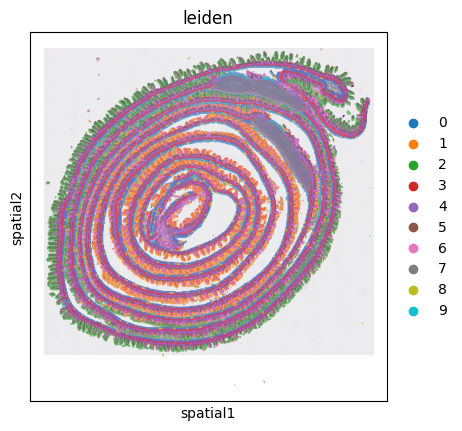

In [10]:
sc.pl.spatial(adata, color='leiden')

In [11]:
stepc.save("./results/visium-hd/config")
adata.write_h5ad("./results/visium-hd/mouse_intesitine_16um.h5ad")

Saving model...
Saving model config...
Saving dataset config...


## 8 um bin size: Spatial domain identification

In [2]:
adata = read_visium_hd("./data/visium-hd/mouse-intesitine/square_008um/")

In [3]:
stepc = stModel(
    adata=adata,
    n_top_genes=2000,
    edge_clip=1,
)

Trying seurat_v3 for hvgs
not log_transformed
Adding count data to layer 'counts'
Dataset Done
================Dataset Info================
Batch key: None 
Class key: None 
Number of Batches: 1 
Number of Classes: None 
Gene Expr: (350107, 2000)


In [4]:
stepc.run()

Training with e2e pattern
Training graph with single batch
100%|██████████| 2000/2000 [02:27<00:00, 13.52step/s, recon_loss=287.522, kl_loss=0.118, contrast_loss=0.248, graph_ids=None]


Trying seurat_v3 for hvgs
Adding count data to layer 'counts'
Dataset Done
================Dataset Info================
Batch key: None 
Class key: None 
Number of Batches: 1 
Number of Classes: None 
Gene Expr: (326119, 2000)
Loading backbone model...
Backbone model loaded.


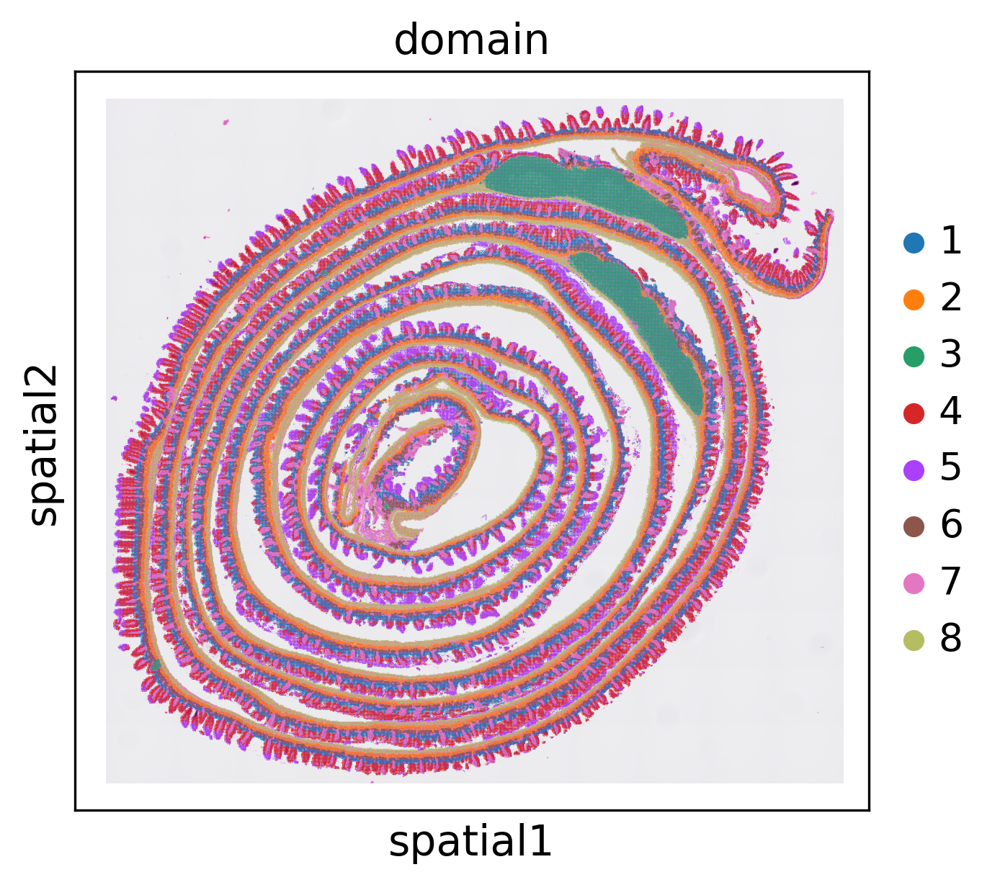

In [16]:
stepc = stModel.load("./results/visium-hd/mouse-intestine/config-8um/", 
                     filepath='./results/visium-hd/mouse_intesitine_8um.h5ad')
stepc.cluster(n_clusters=8)
stepc.spatial_plot(color='domain')

In [6]:
import torch
torch.cuda.empty_cache()

stepc.add_embed(key_added='X_rep')
adata = stepc.adata

sc.pp.neighbors(adata, use_rep='X_rep', n_neighbors=60)
sc.tl.umap(adata)

In [9]:
stepc.save("./results/visium-hd/mouse-intestine/config-8um")
adata.write_h5ad("./results/visium-hd/mouse_intesitine_8um.h5ad")

Saving model...
Saving model config...
Saving dataset config...


In [5]:
adata = sc.read_h5ad("./results/visium-hd/mouse_intesitine_8um.h5ad")

In [6]:
sc.pl.umap(adata, color='domain', show=False, save='8um_domain.svg')

<Axes: title={'center': 'domain'}, xlabel='UMAP1', ylabel='UMAP2'>

In [21]:
adata = stepc.adata
sc.tl.rank_genes_groups(adata, groupby='domain', method='wilcoxon', dendrogram=False, use_raw=True)
sc.tl.dendrogram(adata, groupby='domain')

         Falling back to preprocessing with `sc.pp.pca` and default params.


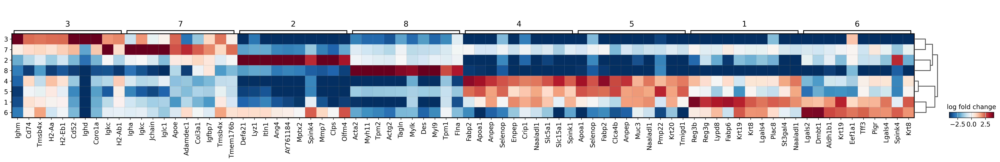

In [22]:
sc.settings.figdir = "./results/visium-hd/mouse-intestine/config-8um/"
sc.pl.rank_genes_groups_matrixplot(adata, 
                                   groupby='domain', 
                                   values_to_plot='logfoldchanges', 
                                   cmap='RdBu_r',
                                   use_raw=True,
                                   vmin=-4, vmax=4, save="8um_domain.svg")

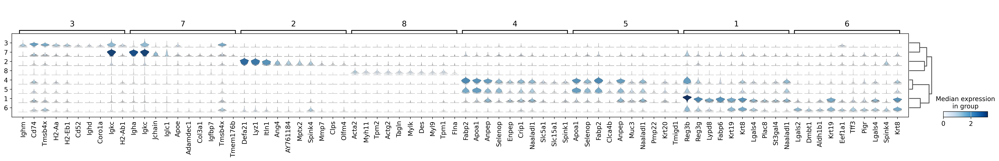

In [23]:
sc.pl.rank_genes_groups_stacked_violin(adata, groupby='domain', use_raw=True, save="8um_domain.svg")

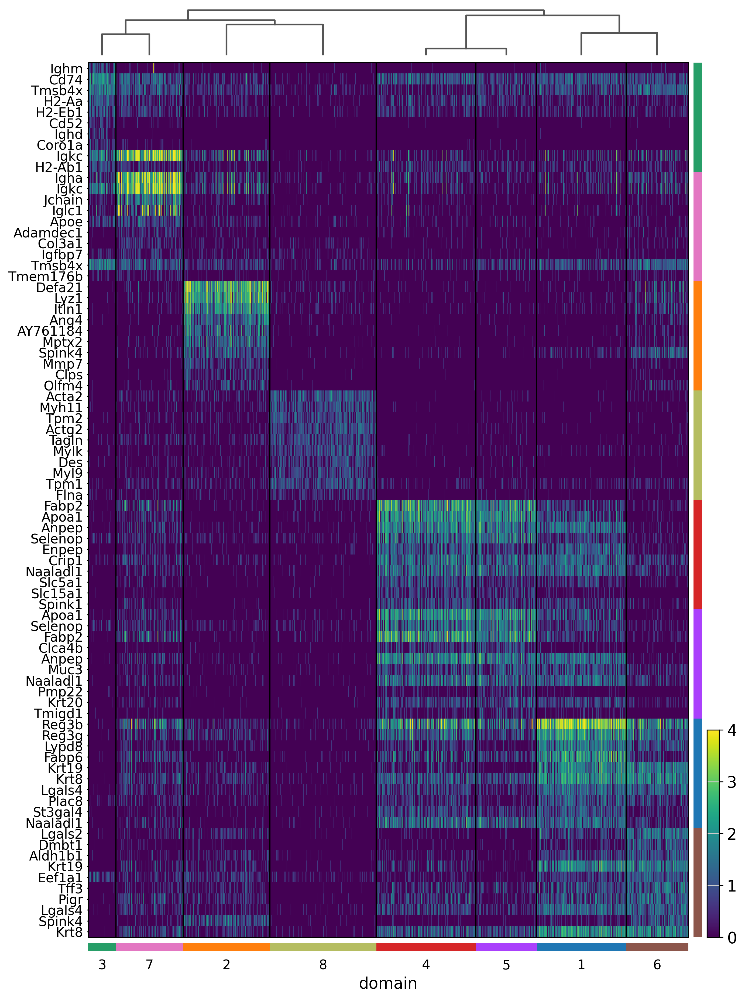

In [24]:
sc.pl.rank_genes_groups_heatmap(adata, groupby='domain', use_raw=True, save="_8um_domain.svg", n_genes=10, swap_axes=True, show_gene_labels=True, vmax=4)

## 8 um bin size: Cell type clustering

In [2]:
adata = read_visium_hd("./data/visium-hd/mouse-intesitine/square_008um/")

In [3]:
stepc = scModel(
    adata=adata,
    n_top_genes=2000,
)

Trying seurat_v3 for hvgs
not log_transformed
Adding count data to layer 'counts'
================Dataset Info================
Batch key: None 
Class key: None 
Number of Batches: 1 
Number of Classes: None 
Gene Expr: (350107, 2000)


In [4]:
stepc.run(epochs=400, batch_size=4096)

Performing global random split
Current Mode: single_batch: ['gene_expr']
 51%|█████▏    | 205/400 [52:39<50:05, 15.41s/epoch, kl_loss=0.870, recon_loss=128.897, val_kl_loss=0.874/0.493, val_recon_loss=127.831/127.675]  


EarlyStopping counter: 30 out of 30
EarlyStopping counter: 205 out of 10


In [5]:
adata = stepc.adata

sc.pp.neighbors(adata, use_rep='X_rep', n_neighbors=60)
sc.tl.umap(adata)

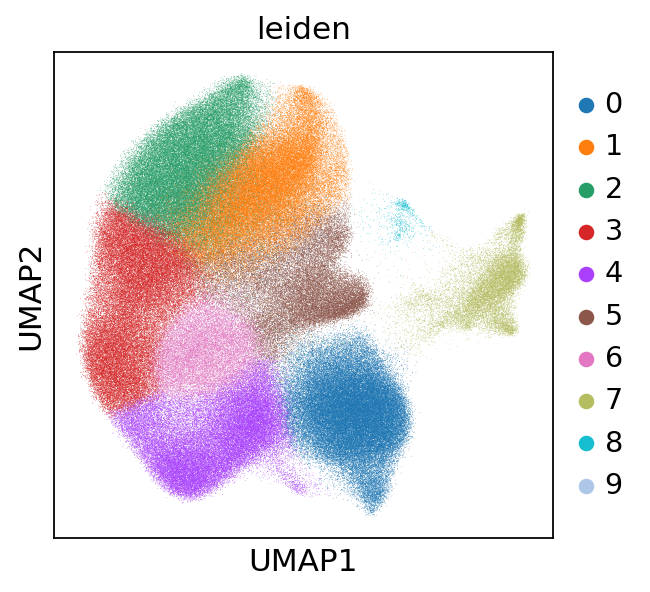

In [28]:
sc.tl.leiden(adata, resolution=0.8)
sc.pl.umap(adata, color='leiden')

In [29]:
adata.obs['leiden'].value_counts()

leiden
0    66024
1    59749
2    55412
3    51634
4    48614
5    31971
6    19494
7    15783
8      952
9      474
Name: count, dtype: int64

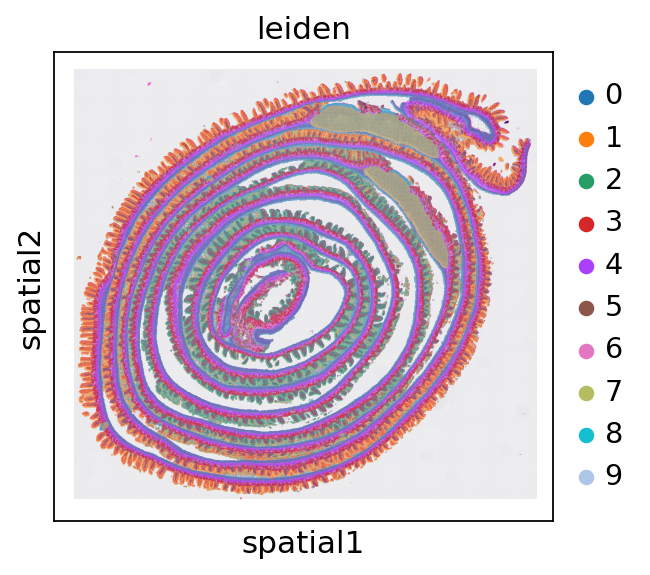

In [30]:
sc.pl.spatial(adata, color='leiden')

In [17]:
# stepc.save("./results/visium-hd/mouse-intestine/config-8um-sc")
adata.write_h5ad("./results/visium-hd/mouse_intesitine_8um_sc.h5ad")

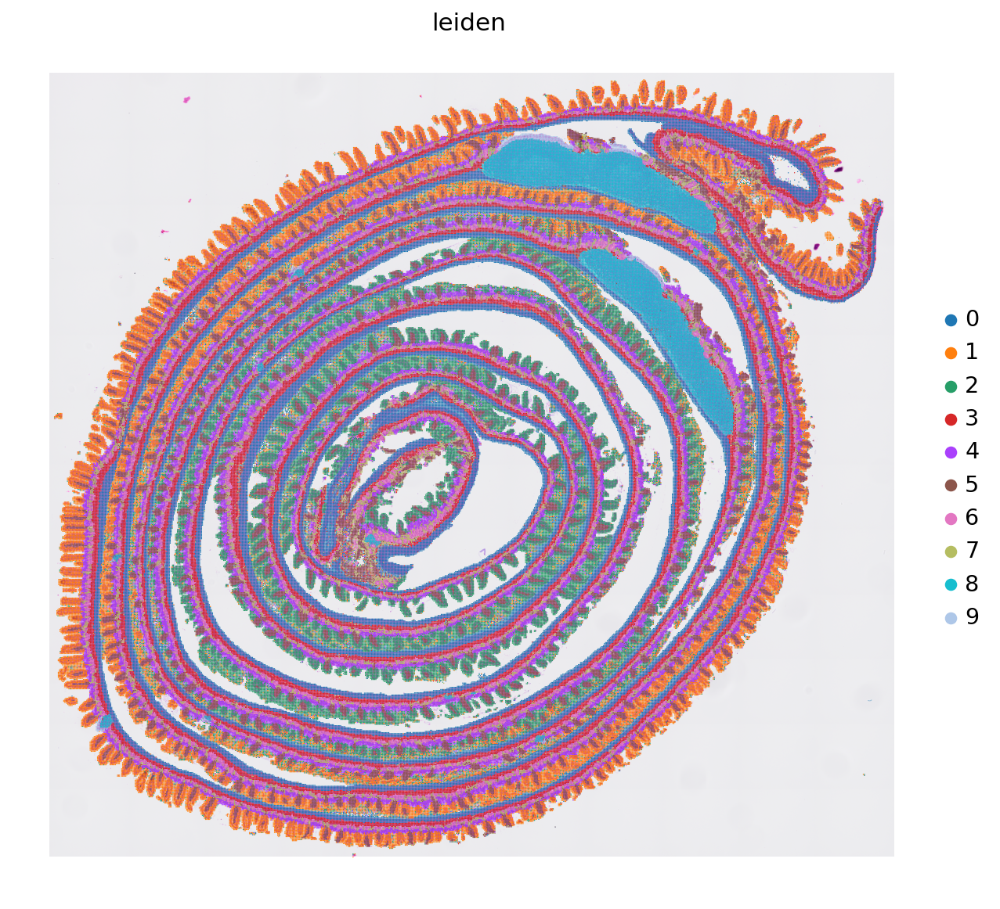

<Axes: title={'center': 'leiden'}, xlabel='UMAP1', ylabel='UMAP2'>

In [18]:
# adata = sc.read_h5ad("./results/visium-hd/mouse_intesitine_8um_sc.h5ad")
sc.set_figure_params(dpi_save=300, figsize=(12, 9))
sc.settings.figdir = "./results/visium-hd/mouse-intestine/config-8um/"
sc.pl.spatial(adata, color='leiden', frameon=False, save='_leiden_8um.svg')
sc.pl.umap(adata, color='leiden', frameon=False, save='_leiden_8um.svg', show=False)
# sc.pl.spatial(adata, color='leiden',)

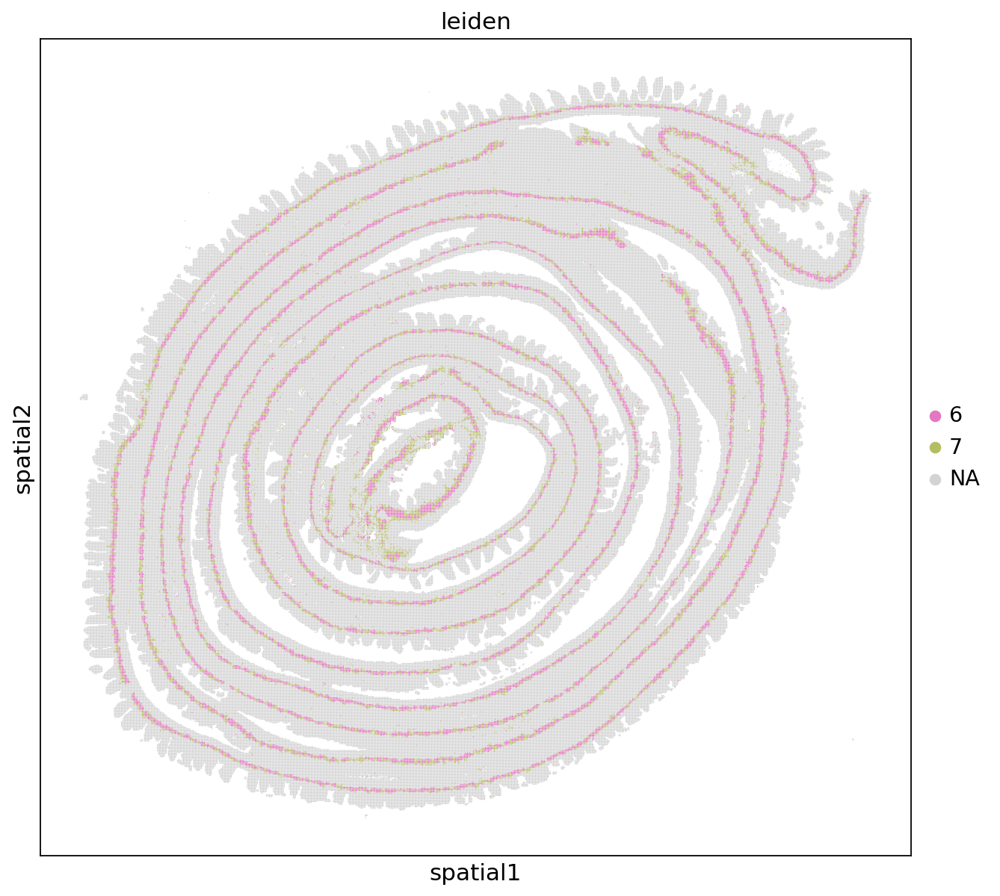

In [16]:
sc.pl.spatial(adata, color='leiden', groups=['6', '7'], img_key=None)

In [5]:
adata.obs['leiden'].value_counts()

leiden
0     65263
1     56211
2     50772
3     43814
4     38120
5     32429
6     25935
7     19934
8     15772
9      1014
10      836
11        7
Name: count, dtype: int64

In [7]:
adata.obs['leiden'] = adata.obs['leiden'].astype(str).apply(lambda x: '0' if x in ['10', '11'] else x)
adata.obs['leiden'] = pd.Categorical(adata.obs['leiden'])

In [ ]:
sc.pl.umap(adata, color='leiden', show=False, save='_leiden_8um.svg')
sc.pl.spatial(adata, color='leiden', frameon=False, show=False, save='_leiden_8um.svg')

In [10]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon', dendrogram=False, use_raw=True)
sc.tl.dendrogram(adata, groupby='leiden')

         Falling back to preprocessing with `sc.pp.pca` and default params.


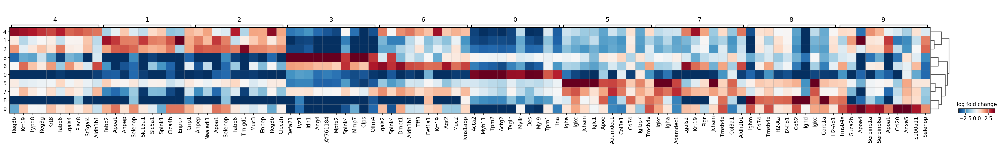

In [11]:
sc.settings.figdir = "./results/visium-hd/mouse-intestine/config-8um/"
sc.pl.rank_genes_groups_matrixplot(adata, 
                                   groupby='leiden', 
                                   values_to_plot='logfoldchanges', 
                                   cmap='RdBu_r',
                                   use_raw=True,
                                   vmin=-4, vmax=4, save="8um_ct.svg")

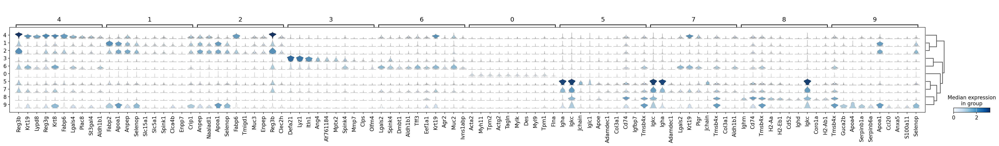

In [12]:
sc.pl.rank_genes_groups_stacked_violin(adata, groupby='leiden', use_raw=True, save="8um_ct.svg")

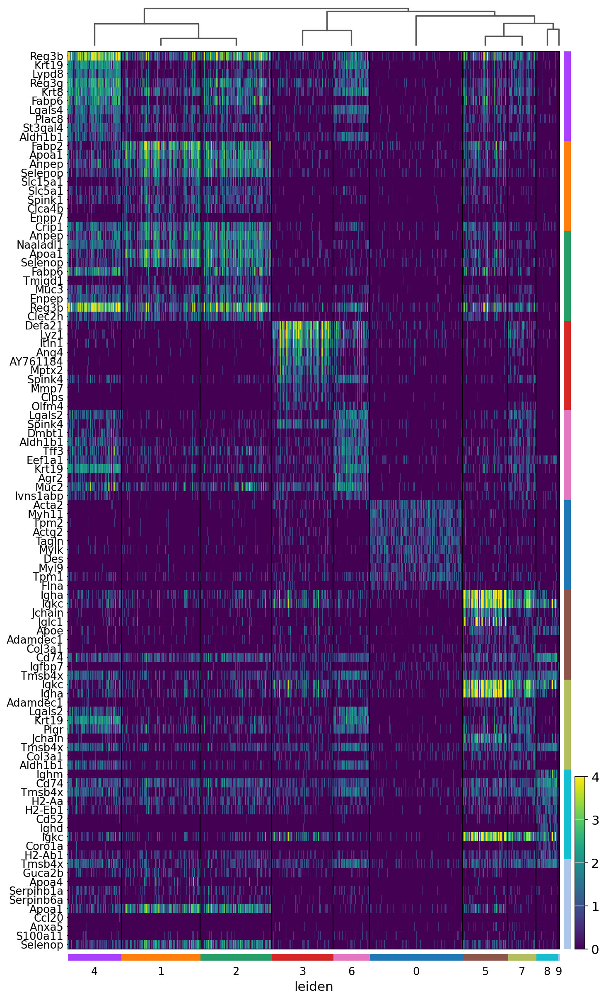

In [13]:
sc.pl.rank_genes_groups_heatmap(adata, groupby='leiden', use_raw=True, save="_8um_ct.svg", n_genes=10, swap_axes=True, show_gene_labels=True, vmax=4)